**Author :**  Bitingo Josaphat JB


---


**WhatsApp :** +256703595423

**Telephone :** +243970802135


---


Author E-mail: bitingojosaphat@gmail.com

# **Facial Key Points Detection (Experiments )Using Pytorch**


---

▶

In [47]:
from __future__ import division
import pandas as pd
import numpy as np

In [49]:
# Installing this real version of this library so that you can be able to import this ToTensorV0 method
# Intalling this real version of this library so that you can be avle to import this TotensorV0 method from tensorflow and keras.
# By the way i never used this library before so what i am trying to do is to import this library and a certain method inside of it
!pip install albumentations==0.4.6

In [50]:
# This is The Config.py File

import torch
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
LEARNING_RATE = 1e-4
WEIGHT_DECAY = 5e-4
BATCH_SIZE = 64
NUM_EPOCHS = 100
NUM_WORKERS = 4
CHECKPOINT_FILE = "b0_15.pth.tar" # But also you can the use the other Model that i got to train before. Which is "b0_15.pth.tar"
PIN_MEMORY = True
SAVE_MODEL = True
LOAD_MODEL = True

# Data augmentation for images
train_transforms = A.Compose(
    [
        A.Resize(width=96, height=96),
        A.Rotate(limit=15, border_mode=cv2.BORDER_CONSTANT, p=0.8),
        A.IAAAffine(shear=15, scale=1.0, mode="constant", p=0.2),
        A.RandomBrightnessContrast(contrast_limit=0.5, brightness_limit=0.5, p=0.2),
        A.OneOf([
            A.GaussNoise(p=0.8),
            A.CLAHE(p=0.8),
            A.ImageCompression(p=0.8),
            A.RandomGamma(p=0.8),
            A.Posterize(p=0.8),
            A.Blur(p=0.8),
        ], p=1.0),
        A.OneOf([
            A.GaussNoise(p=0.8),
            A.CLAHE(p=0.8),
            A.ImageCompression(p=0.8),
            A.RandomGamma(p=0.8),
            A.Posterize(p=0.8),
            A.Blur(p=0.8),
        ], p=1.0),
        A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=0, p=0.2, border_mode=cv2.BORDER_CONSTANT),
        A.Normalize(
            mean=[0.4897, 0.4897, 0.4897],
            std=[0.2330, 0.2330, 0.2330],
            max_pixel_value=255.0,
        ),
        ToTensorV2(),
    ], keypoint_params=A.KeypointParams(format="xy", remove_invisible=False),
)


val_transforms = A.Compose(
    [
        A.Resize(height=96, width=96),
        A.Normalize(
            mean=[0.4897, 0.4897, 0.4897],
            std=[0.2330, 0.2330, 0.2330],
            max_pixel_value=255.0,
        ),
        ToTensorV2(),
    ], keypoint_params=A.KeypointParams(format="xy", remove_invisible=False),
)

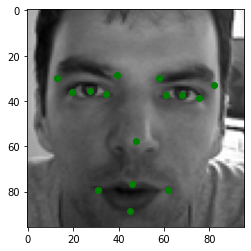

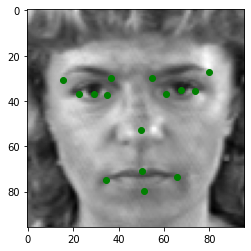

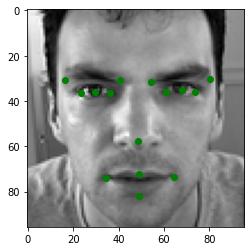

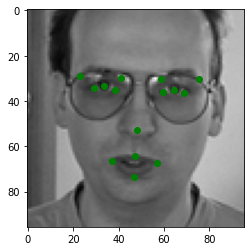

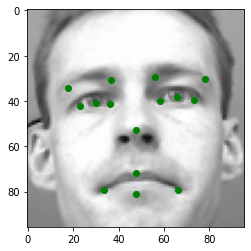

...

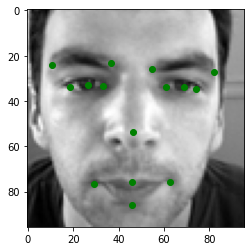

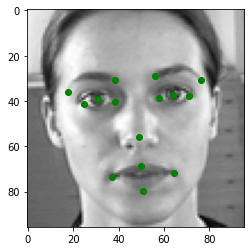

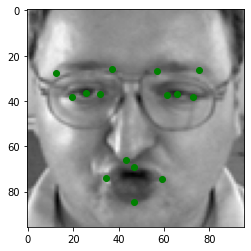

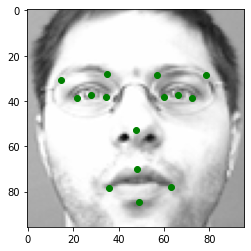

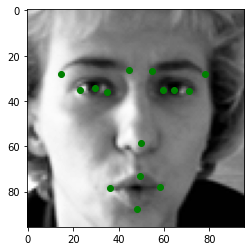

ValueError: ignored

In [51]:
# Here is The Dataset.py File

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, Dataset


class FacialKeypointDataset(Dataset):
    def __init__(self, csv_file, train=True, transform=None):
        super().__init__()
        self.data = pd.read_csv(csv_file)
        self.category_names = ['left_eye_center_x', 'left_eye_center_y', 'right_eye_center_x', 'right_eye_center_y', 'left_eye_inner_corner_x', 'left_eye_inner_corner_y', 'left_eye_outer_corner_x', 'left_eye_outer_corner_y', 'right_eye_inner_corner_x', 'right_eye_inner_corner_y', 'right_eye_outer_corner_x', 'right_eye_outer_corner_y', 'left_eyebrow_inner_end_x', 'left_eyebrow_inner_end_y', 'left_eyebrow_outer_end_x', 'left_eyebrow_outer_end_y', 'right_eyebrow_inner_end_x', 'right_eyebrow_inner_end_y', 'right_eyebrow_outer_end_x', 'right_eyebrow_outer_end_y', 'nose_tip_x', 'nose_tip_y', 'mouth_left_corner_x', 'mouth_left_corner_y', 'mouth_right_corner_x', 'mouth_right_corner_y', 'mouth_center_top_lip_x', 'mouth_center_top_lip_y', 'mouth_center_bottom_lip_x', 'mouth_center_bottom_lip_y']
        self.transform = transform
        self.train = train

    def __len__(self):
        return self.data.shape[0]

    def __getitem__(self, index):
      image = np.array(self.data.iloc[index, 30].split()).astype(np.float32)
      if self.train:
        labels = np.array(self.data.iloc[index, :30].tolist())
        labels[np.isnan(labels)] = -1
      else:
        image = np.array(self.data.iloc[index, 1].split()).astype(np.float32)
        labels = np.zeros(30)

      ignore_indices = labels == -1
      labels = labels.reshape(15, 2)

      if self.transform:
        image = np.repeat(image.reshape(96, 96, 1), 3, 2).astype(np.uint8)
        augmentations = self.transform(image=image, keypoints=labels)
        image = augmentations["image"]
        labels = augmentations["keypoints"]

      labels = np.array(labels).reshape(-1)
      labels[ignore_indices] = -1

      return image, labels.astype(np.float32)


if __name__ == "__main__":
  ds = FacialKeypointDataset(csv_file="/content/drive/MyDrive/Facial-Key-Points-Detector/data/training.csv", train=True, transform=val_transforms) #You can also change The Tranform value to transfom = train_transforms
  loader = DataLoader(ds, batch_size=1, shuffle=True, num_workers=0)

  for idx, (x, y) in enumerate(loader):
    plt.imshow(x[0][0].detach().cpu().numpy(), cmap='gray')
    plt.plot(y[0][0::2].detach().cpu().numpy(), y[0][1::2].detach().cpu().numpy(), "go")
    plt.show()

In [52]:
# Loading the CSV File For the Training and Testing Dataset
# Credit Goes to The https://kaggle.com/c/face-key-points-dector

train = pd.read_csv('/content/drive/MyDrive/Facial-Key-Points-Detector/data/training.csv')
test = pd.read_csv('/content/drive/MyDrive/Facial-Key-Points-Detector/data/test.csv')

In [53]:
train.head(1)

,left_eye_center_x,left_eye_center_y,right_eye_center_x,right_eye_center_y,left_eye_inner_corner_x,left_eye_inner_corner_y,left_eye_outer_corner_x,left_eye_outer_corner_y,right_eye_inner_corner_x,right_eye_inner_corner_y,...,nose_tip_y,mouth_left_corner_x,mouth_left_corner_y,mouth_right_corner_x,mouth_right_corner_y,mouth_center_top_lip_x,mouth_center_top_lip_y,mouth_center_bottom_lip_x,mouth_center_bottom_lip_y,Image
0,66.033564,39.002274,30.227008,36.421678,59.582075,39.647423,73.130346,39.969997,36.356571,37.389402,...,57.066803,61.195308,79.970165,28.614496,77.388992,43.312602,72.935459,43.130707,84.485774,238 236 237 238 240 240 239 241 241 243 240 23...


In [54]:
train.shape

(501, 31)

In [55]:
test.head(1)

,ImageId,Image
0,1,182 183 182 182 180 180 176 169 156 137 124 10...


In [60]:
test.shape

(752, 2)

In [61]:
train_15_landmarks = train[~ (train.isnull().sum(axis=1) > 20)].copy()
train_4_landmarks = train[(train.isnull().sum(axis=1) > 20)].copy()

In [62]:
train_15_landmarks.iloc[0:100, :].to_csv("/content/drive/MyDrive/Facial-Key-Points-Detector/data/val_15.csv")
train_15_landmarks.iloc[100: , :].to_csv('/content/drive/MyDrive/Facial-Key-Points-Detector/data/train_15.csv')

In [63]:
train_4_landmarks.iloc[0:200, :].to_csv('/content/drive/MyDrive/Facial-Key-Points-Detector/data/val_4.csv')
train_4_landmarks.iloc[200: , :].to_csv('/content/drive/MyDrive/Facial-Key-Points-Detector/data/train_4.csv')

In [64]:
# This is the Utils.py File

import torch
import numpy as np
import pandas as pd
from tqdm import tqdm


def get_submission(loader, dataset, model_15, model_4):
  """
  This can be done a lot faster.. but it didn't take
  too much time to do it in this inefficient way
  """
  model_15.eval()
  model_4.eval()
  id_lookup = pd.read_csv("/content/drive/MyDrive/Facial-Key-Points-Detector/data/IdLookupTable (1).csv")
  predictions = []
  image_id = 1

  for image, label in tqdm(loader):
    image = image.to(DEVICE)
    preds_15 = torch.clip(model_15(image).squeeze(0), 0.0, 96.0)
    preds_4 = torch.clip(model_4(image).squeeze(0), 0.0, 96.0)
    feature_names = id_lookup.loc[id_lookup["ImageId"] == image_id]["FeatureName"]

    for feature_name in feature_names:
      feature_index = dataset.category_names.index(feature_name)
      if feature_names.shape[0] < 10:
        predictions.append(preds_4[feature_index].item())
      else:
        predictions.append(preds_15[feature_index].item())

    image_id += 1

  df = pd.DataFrame({"RowId": np.arange(1, len(predictions)+1), "Location": predictions})
  df.to_csv("/content/drive/MyDrive/Facial-Key-Points-Detector/data/submission.csv", index=False)
  model_15.train()
  model_4.train()


def get_rmse(loader, model, loss_fn, device):
  model.eval()
  num_examples = 0
  losses = []
  for batch_idx, (data, targets) in enumerate(loader):
    data = data.to(device=device)
    targets = targets.to(device=device)

    # forward
    scores = model(data)
    loss = loss_fn(scores[targets != -1], targets[targets != -1])
    num_examples += scores[targets != -1].shape[0]
    losses.append(loss.item())

  model.train()
  print(f"Loss on val: {(sum(losses)/num_examples)**0.5}")


def save_checkpoint(state, filename="/content/drive/MyDrive/Facial-Key-Points-Detector/data/my_checkpoint.pth.tar"):
  print("=> Saving checkpoint")
  torch.save(state, filename)


def load_checkpoint(checkpoint, model, optimizer, lr):
  print("=> Loading checkpoint")
  model.load_state_dict(checkpoint["state_dict"])
  optimizer.load_state_dict(checkpoint["optimizer"])

  # If we don't do this then it will just have learning rate of old checkpoint
  # and it will lead to many hours of debugging \:
  for param_group in optimizer.param_groups:
    param_group["lr"] = lr

In [65]:
!pip install validators

In [66]:
from torch._C import device
efficientnet = torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_efficientnet_b0', pretrained=True)
utils = torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_convnets_processing_utils')

efficientnet.eval().to(DEVICE)

Using cache found in /root/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub
Using cache found in /root/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub


EfficientNet(
  (stem): Sequential(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
    (activation): SiLU(inplace=True)
  )
  (layers): Sequential(
    (0): Sequential(
      (block0): MBConvBlock(
        (depsep): Sequential(
          (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (se): SequentialSqueezeAndExcitation(
          (squeeze): Linear(in_features=32, out_features=8, bias=True)
          (expand): Linear(in_features=8, out_features=32, bias=True)
          (activation): SiLU(inplace=True)
          (sigmoid): Sigmoid()
          (mul_a_quantizer): Identity()
          (mul_b_quantizer): Identity()
        )
      

In [67]:
!pip install efficientnet_pytorch

In [81]:
# This is te Train.py File In Which i train the model
from torch import nn, optim
import os
from torch.utils.data import DataLoader
from tqdm import tqdm
from efficientnet_pytorch import EfficientNet



def train_one_epoch(loader, model, optimizer, loss_fn, scaler, device):
  losses = []
  loop = tqdm(loader)
  num_examples = 0
  for batch_idx, (data, targets) in enumerate(loop):
    data = data.to(device=device)
    targets = targets.to(device=device)

   # forward
    scores = model(data)
    scores[targets == -1] = -1
    loss = loss_fn(scores, targets)
    num_examples += torch.numel(scores[targets != -1])
    losses.append(loss.item())

    # backward
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

  # print(f"Loss average over epoch: {(sum(losses)/num_examples)**0.5}")


def main():
  train_ds = FacialKeypointDataset(csv_file ="/content/drive/MyDrive/Facial-Key-Points-Detector/data/train_4.csv", train=True, transform=train_transforms)#You can also change The Tranform value to transfom = train_transforms
  # loader = DataLoader(ds, batch_size=1, shuffle=True, num_workers=0)

  train_loader = DataLoader(
        train_ds,
        batch_size=BATCH_SIZE,
        num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY,
        shuffle=False,
    )
  # = DataLoader(ds, batch_size=1, shuffle=True, num_workers=0)

  val_ds = FacialKeypointDataset(
        transform=val_transforms,
        csv_file="/content/drive/MyDrive/Facial-Key-Points-Detector/data/val_4.csv",
    )

  val_loader = DataLoader(
        val_ds,
        batch_size=BATCH_SIZE,
        num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY,
        shuffle=False,
    )

  test_ds = FacialKeypointDataset(
        csv_file="/content/drive/MyDrive/Facial-Key-Points-Detector/data/test.csv",

        transform=val_transforms,
        train=False,
    )

  test_loader = DataLoader(
        test_ds,
        batch_size=1,
        num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY,
        shuffle=False,
    )
  loss_fn = nn.MSELoss(reduction="sum")
  model = EfficientNet.from_pretrained("efficientnet-b0")
  model._fc = nn.Linear(1280, 30)
  model = model.to(DEVICE)
  optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)
  scaler = torch.cuda.amp.GradScaler()

  model_4 = EfficientNet.from_pretrained("efficientnet-b0")
  model_4._fc = nn.Linear(1280, 30)
  model_15 = EfficientNet.from_pretrained("efficientnet-b0")
  model_15._fc = nn.Linear(1280, 30)
  model_4 = model_4.to(DEVICE)
  model_15 = model_15.to(DEVICE)

  if LOAD_MODEL and CHECKPOINT_FILE in os.listdir():
    load_checkpoint(torch.load(CHECKPOINT_FILE), model, optimizer, LEARNING_RATE)
    load_checkpoint(torch.load("b0_4.pth.tar"), model_4, optimizer, LEARNING_RATE)
    load_checkpoint(torch.load("b0_15.pth.tar"), model_15, optimizer, LEARNING_RATE)

  get_submission(train_loader, train_ds, model_15, model_4)

  for epoch in range(NUM_EPOCHS):
    get_rmse(val_loader, model, loss_fn, device)
    train_one_epoch(train_loader, model, optimizer, loss_fn, scaler,DEVICE)

    # get on validation
    if SAVE_MODEL:
      checkpoint = {
                "state_dict": model.state_dict(),
                "optimizer": optimizer.state_dict(),
            }
      save_checkpoint(checkpoint, filename=CHECKPOINT_FILE)

if __name__ == "__main__":
    main()

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Loaded pretrained weights for efficientnet-b0
Loaded pretrained weights for efficientnet-b0


/usr/local/lib/python3.7/dist-packages/torch/cuda/amp/grad_scaler.py:115: UserWarning: torch.cuda.amp.GradScaler is enabled, but CUDA is not available.  Disabling.
  warnings.warn("torch.cuda.amp.GradScaler is enabled, but CUDA is not available.  Disabling.")


Loaded pretrained weights for efficientnet-b0


0it [00:00, ?it/s]


ZeroDivisionError: ignored

In [ ]:
# Extracting the Image From the CSV Files

import numpy as np
import pandas as pd
import os
from PIL import Image


def extract_images_from_csv(csv, column, save_folder, resize=(96, 96)):
  # Managing the " No Such directory Error"
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)

    for idx, image in enumerate(csv[column]):
        image = np.array(image.split()).astype(np.uint8)
        image = image.reshape(resize[0], resize[1])
        img = Image.fromarray(image, 'L')
        img.save(save_folder+f"img_{idx}.png")


csv = pd.read_csv("/content/drive/MyDrive/Facial-Key-Points-Detector/data/training.csv")
extract_images_from_csv(csv, "Image", "/content/drive/MyDrive/Facial-Key-Points-Detector/data/")